В файле csv информация по активности пользователей сайтов, колонка second это время в секундах, в которое замечена активность. USD - сколько пользователь потратил денег. остальные параметры без названий, мы их немного трансформировали, но пропорции все сохранены. Данные размечены (среди пользователей были боты). Колонка Класс - это собственно бот-не_бот.

- Задача 1. Найти аномалии в данных (считай, что они не размечены).

- Задача 2. Построить классификатор. В качестве ответа нужен файлик с как можно более подробным описанием всех действий, кодом, графиками (все, что посчитаешь нужным)

In [1]:
import pandas as pd
import numpy as np
import os

pd.set_option("display.max_rows", 100)
pd.set_option('display.max_columns', 200)

import warnings
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'svg'

from tqdm import tqdm

import matplotlib.pylab as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [12.0, 4.0]
plt.rcParams['figure.dpi'] = 80

In [2]:
import platform
print(platform.processor())
print('cpu\t\t: {}'.format(os.cpu_count()))
!cat /proc/meminfo | grep MemTotal

x86_64
cpu		: 8
MemTotal:        8056056 kB


In [2]:
data = pd.read_csv('dataset.csv')
data.head()

,second,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12,var13,var14,var15,var16,var17,var18,var19,var20,var21,var22,var23,var24,var25,var26,var27,var28,USD,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [4]:
data.describe()

,second,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12,var13,var14,var15,var16,var17,var18,var19,var20,var21,var22,var23,var24,var25,var26,var27,var28,USD,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.933482e-15,5.624307e-16,-8.769071e-15,2.754994e-15,-1.549370e-15,2.015659e-15,-1.694249e-15,-1.934013e-16,-3.137068e-15,1.772195e-15,9.154375e-16,-1.810658e-15,1.693189e-15,1.466022e-15,3.495508e-15,1.387417e-15,-7.528491e-16,4.328772e-16,9.050481e-16,5.128913e-16,1.539352e-16,7.959971e-16,5.367590e-16,4.458436e-15,1.453403e-15,1.698783e-15,-3.656426e-16,-1.190300e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


Данные без пропусков, исключительно числовые, есть куча обезличенных переменных типо $var_n$ - нормированные на среднее признаки в числе 28 штук, по всей видимости какие-то ежедневные лаги, вполне вероятно, что это нормированное на среднее число денег, потраченное пользователем в предыдущие дни. 

По числу секунд можно определить, что перед нами срез за 2 дня

In [5]:
print('Число дней: {}'.format((data.second.max() + 1) / 60 / 60 / 24))

Число дней: 1.9999189814814813


In [6]:
data.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

Выборка несбалансированная - ботовых транзакций намного меньше, чем пользовательских

Обнаружил интересную штуку в том, что наборы признаков $val_n$ могут встречаться целиком совпадающими группами.
Сначала я это связал с тем, что мы нашли транзакции одного и того же клиента, однако так же это вполне может оказаться мусором и багом учетной системы.

Тем не менее, заведем еще одну колонку client_id, в которой и будут проиндексированы все эти группы. 
- Если в рамках одной группы все транзакции совершены в одно время и на одинаковую сумму, то я склонен считать все продублированные элементы мусором.

- Если же у них USD отлично перед нами определенно разные транзакции одного клиента.

- Если же USD одинаково, но транзакции совершены в разное время, то нужно смотреть глубже.

Чтобы ускорить вычисления введу что-то вроде хэш-функции от вар-колонок - просто их сумму и буду группировать значения по ней.

In [7]:
help_data = data.reset_index()
var_cols = [col for col in data.columns if 'var' in col]
help_data['VAR'] = data[var_cols].sum(axis=1)
help_data.drop(var_cols, 1, inplace=True)
help_data['source_index'] = help_data['index'].astype(int).astype(str)
help_data = help_data[['source_index', 'VAR']]
help_data.source_index = help_data.source_index + ','
need_vars = help_data.VAR.value_counts()[help_data.VAR.value_counts() > 1].index
var_indexes = help_data[help_data.VAR.isin(need_vars)].groupby('VAR')[['source_index']].apply(sum)
var_indexes.source_index = var_indexes.source_index.apply(lambda x: x[:-1])
uniq_indexes = pd.DataFrame(index=help_data[help_data.VAR.isin(need_vars)==False].VAR)
uniq_indexes['source_index'] = np.where(help_data.VAR.isin(need_vars)==False)[0].astype(str)
var_indexes = var_indexes.append(uniq_indexes)
var_indexes['client_id'] = np.arange(var_indexes.shape[0])
var_indexes.head(10)

,source_index,client_id
VAR,,
-174.807818,"151006,151007,151008,151009",0
-114.242088,"150679,150680",1
-113.341410,"150677,150678",2
-105.043222,"150666,150667",3
-103.261741,"150668,150669",4
-92.100639,"150660,150661",5
-91.617307,"150662,150663",6
-72.701858,"102441,102442,102443,102444,102445,102446",7
-61.657676,"143333,143334",8


In [9]:
data['client_id'] = help_data.VAR.map(var_indexes.client_id)
del(help_data)
data.head()

,second,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12,var13,var14,var15,var16,var17,var18,var19,var20,var21,var22,var23,var24,var25,var26,var27,var28,USD,Class,client_id
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,5149
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,5150
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,5151
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,5152
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,5153


Проверим, есть ли такие "клиенты", у которых были и ботовые транзакции, так и неботовые

In [10]:
hypo = data.groupby(['client_id', 'Class'])['USD'].count().reset_index()
hypo.columns = ['client_id', 'class', 'count']
print('Число клиентов с транзакциями обоих типов: {}'.format(
    hypo.client_id.value_counts()[hypo.client_id.value_counts()>1].shape[0]))
hypo.head()

Число клиентов с транзакциями обоих типов: 0


,client_id,class,count
0,0,1,4
1,1,1,2
2,2,1,2
3,3,1,2
4,4,1,2


Отлично, таких нет. Тогда для начала не будем париться и удалим все дубликаты, для которых USD оказалось одинаковым.

In [3]:
var_cols = [col for col in data.columns if 'var' in col]
clean_data = data.iloc[data[var_cols + ['USD']].drop_duplicates().index]
print(clean_data.shape[0], data.shape[0])

275663 284807


Порядка 9000 мусорных транзакций. Да, среди них были боты, однако всех уникальных мы оставили

### Посмотрим на возможность решения в лоб: используя частоты
Для этого порисуем всякие графички

In [4]:
def draw_plot_by_seconds(data, agg_func, agg_col, title):
    ts = pd.DataFrame(np.arange(data.second.max() + 1), columns=['second'])
    ts = pd.merge(ts, data.groupby('second').agg(agg_func)[agg_col].reset_index(), on='second', how='left').fillna(0)
    ts.columns = ['second', 'trans']
    ts.trans.plot(title=title)

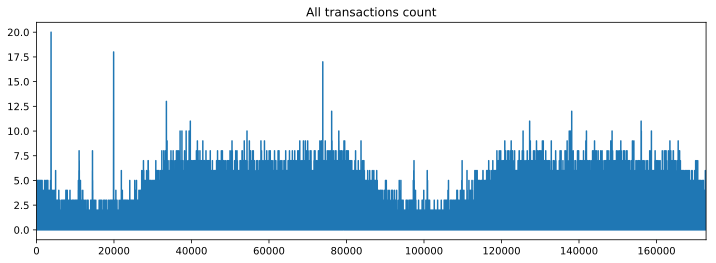

In [5]:
draw_plot_by_seconds(clean_data, 'count', 'USD', 'All transactions count')

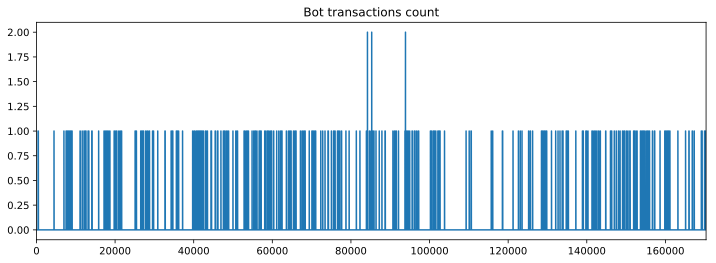

In [6]:
draw_plot_by_seconds(clean_data[clean_data.Class == 1], 'count', 'USD', 'Bot transactions count')

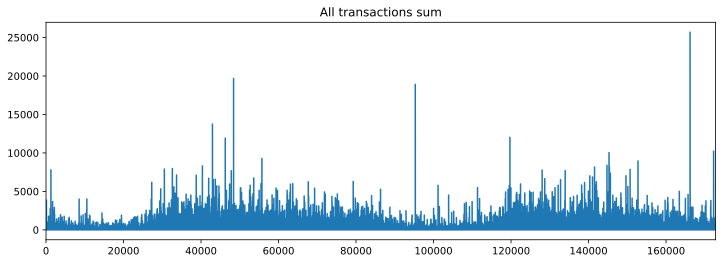

In [15]:
draw_plot_by_seconds(clean_data, 'sum', 'USD', 'All transactions sum')

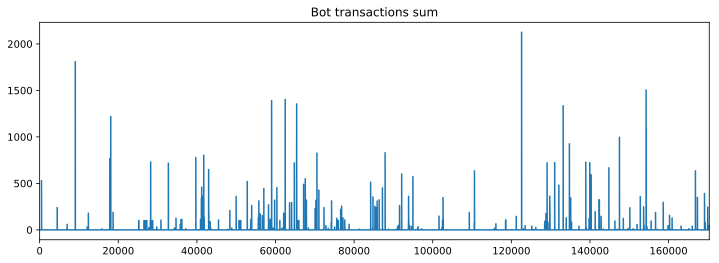

In [16]:
draw_plot_by_seconds(clean_data[clean_data.Class == 1], 'sum', 'USD', 'Bot transactions sum')

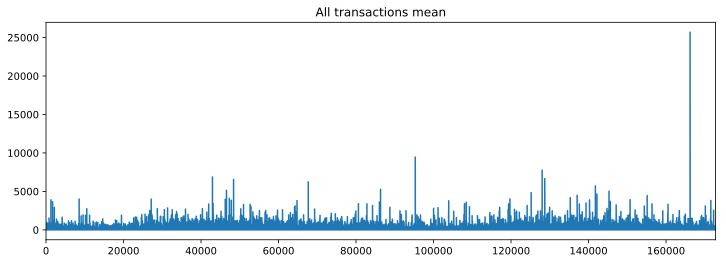

In [17]:
draw_plot_by_seconds(clean_data, 'mean', 'USD', 'All transactions mean')

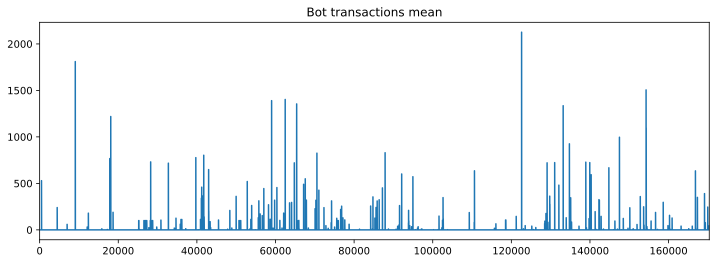

In [18]:
draw_plot_by_seconds(clean_data[clean_data.Class == 1], 'mean', 'USD', 'Bot transactions mean')

Такие дела. Кажется мы имеем дело с ботами крохоборами. Придется смотреть на $var_n$ признаки. Для начала считерим и воспользуемся нашими метками, дабы проверить, разделимы ли наши классы вообще. Например, линейно. 

## Первое поколение классификации
Как оговаривалось выше, классы у нас несбалансированные, так что в качестве метрики качества буду использовать f1-score. Хотя конечно, тут не все так однозначно ввиду несимметричной бизнесовой функции потерь - ошибки первого и второго рода могут иметь разный вес, и как будто бы полнота первого класса чуть важнее. Но пока забудем об этом.
Проверять буду на кросс-валидации по 5 фолдам. Ну и для простоты повыкидываю все кроме usd и $var_n$.
При этом USD сначала нормирую. Остальное нормирую на среднеквадратичное отклонение.

In [8]:
from sklearn.preprocessing import StandardScaler
X = clean_data[var_cols]
y = clean_data.Class
X['USD'] = StandardScaler().fit_transform(clean_data.USD.reshape(-1, 1))
X = X / X.std()
del(data)
del(clean_data)
X.head()

,var1,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12,var13,var14,var15,var16,var17,var18,var19,var20,var21,var22,var23,var24,var25,var26,var27,var28,USD
0,-0.696436,-0.043653,1.682442,0.967586,-0.245495,0.352104,0.193170,0.082828,0.330683,0.083525,-0.540481,-0.618629,-0.991727,-0.326663,1.599719,-0.534352,0.246172,0.030643,0.492362,0.322344,-0.024972,0.382497,-0.174952,0.110524,0.245222,-0.390621,0.332838,-0.063289,0.233169
1,0.610419,0.159634,0.110432,0.314644,0.043550,-0.062717,-0.063533,0.071418,-0.232182,-0.153607,1.580219,1.066663,0.489261,-0.150931,0.692501,0.526987,-0.135892,-0.217862,-0.177672,-0.088574,-0.307978,-0.879256,0.160405,-0.561219,0.318921,0.260038,-0.022387,0.044263,-0.347091
2,-0.695692,-0.803812,1.176228,0.266639,-0.365135,1.371065,0.638096,0.207852,-1.376823,0.191019,0.611914,0.066172,0.717536,-0.174208,2.556044,-3.282992,1.313851,-0.144194,-2.756614,0.673094,0.338292,1.062367,1.440194,-1.138272,-0.625061,-0.287307,-0.137944,-0.179624,1.137700
3,-0.494884,-0.111096,1.189352,-0.606106,-0.007480,0.949734,0.191566,0.316748,-1.260807,-0.050553,-0.221922,0.178467,0.507929,-0.302260,-0.687990,-1.203707,-0.809749,2.335653,-1.502245,-0.266732,-0.147732,0.007260,-0.301402,-1.941334,1.235037,-0.458399,0.156310,0.184752,0.130015
4,-0.593198,0.526455,1.027316,0.282965,-0.295471,0.073043,0.478044,-0.227034,0.743326,0.692785,-0.806257,0.538917,1.346309,-1.175419,0.190811,-0.512824,-0.280572,-0.045381,0.979241,0.523806,-0.012864,1.098985,-0.217686,0.233287,-0.393016,1.037495,0.546818,0.646788,-0.081308


In [20]:
from sklearn.linear_model import Lasso, RidgeClassifier, LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import f1_score, recall_score, precision_score, classification_report

clf = RidgeClassifier(alpha=1)
y_predicted = cross_val_predict(cv=5, estimator=clf, X=X, y=y)
print('f1_score: {}'.format(f1_score(y, y_predicted)))
print('recall: {}'.format(recall_score(y, y_predicted)))
print('precision: {}'.format(precision_score(y, y_predicted)))
print(classification_report(y_predicted, y))

f1_score: 0.5279770444763271
recall: 0.3890063424947146
precision: 0.8214285714285714
             precision    recall  f1-score   support

          0       1.00      1.00      1.00    275439
          1       0.39      0.82      0.53       224

avg / total       1.00      1.00      1.00    275663



In [21]:
clf = LogisticRegression(C=1)
y_predicted = cross_val_predict(cv=5, estimator=clf, X=X, y=y, n_jobs=-2)
print('f1_score: {}'.format(f1_score(y, y_predicted)))
print('recall: {}'.format(recall_score(y, y_predicted)))
print('precision: {}'.format(precision_score(y, y_predicted)))
print(classification_report(y_predicted, y))

f1_score: 0.6981366459627328
recall: 0.5940803382663847
precision: 0.8463855421686747
             precision    recall  f1-score   support

          0       1.00      1.00      1.00    275331
          1       0.59      0.85      0.70       332

avg / total       1.00      1.00      1.00    275663



Видно, что худо-бедно разделимы. Попробуем для интереса еще нелинейный классификатор без особой настройки параметров

In [15]:
from xgboost import XGBClassifier
clf = XGBClassifier(learning_rate=0.5, max_depth=5, n_estimators=50, nthread=-2, scale_pos_weight=2,
                    reg_alpha=1, reg_lambda=1, objective='binary:logistic')
y_predicted = cross_val_predict(cv=5, estimator=clf, X=X, y=y)
print('f1_score: {}'.format(f1_score(y, y_predicted)))
print('recall: {}'.format(recall_score(y, y_predicted)))
print('precision: {}'.format(precision_score(y, y_predicted)))

f1_score: 0.8106312292358805
recall: 0.773784355179704
precision: 0.8511627906976744


Отлично, это что-то вроде базового ориентира, перед тем как попровать искать аномалии вслепую.

Попробуем чего-нибудь порисовать на тех же данных.

### Тепловая карта корреляции признаков

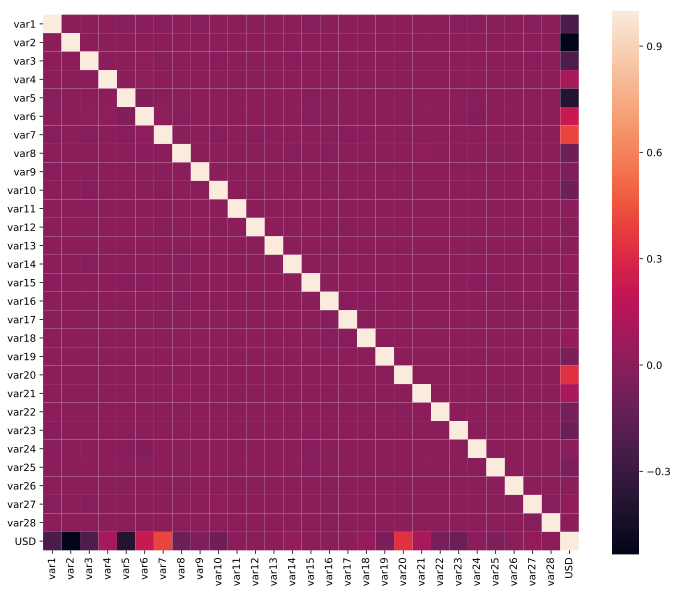

In [9]:
import seaborn
plt.figure(figsize=(12,10))
seaborn.heatmap(X.corr(), square=True)

Особой попарной корреляции мы не наблюдаем. 

При этом приходит мысль о некоторой избыточности всех данных, хотелось бы получить более низкоранговое приближение наших данных, концетрированно нашпигованной полезной информацией)

В общем попробую метод главных компонент, а также несколько нелинейных методов понижения размерности.
Уменьшать буду до 2-3 компонент, дабы появилась возможность какой-то визуализации, а также, чтобы окончательно развеять сомнения в возможности отделения наших классификаторов-крохоборов от остальных пользователей.

Также отмечу, что мне придется создавать некоторые сэмплы из исходных данных, так как с визуализацией совсем всех данных моя машинка не справляется. Более того, применение нелинейных алгоритмов на всём датасете также не представлвяется возможным ввиду высокой их сложности по памяти. 

Быть может получится как-нибудь обхитрить такое ограничение, однако оставлю это на будущее.

В плане семплирования я создал несколько функций - в рамках одной можно выбрать число ботов в выборке, в рамках другой точки берутся просто случайным выбором. Таким образом будем проверять наши алгоритмы в двух вариантах: с повышенной концентрацией ботов и боевой.

Также написал функцию для визуализации наших компонент(которая нам еще пригодится для визуализации работы наших алгоритмов кластеризации)

## Понижение размерности

In [10]:
def get_train_sample(X, y, n, bot_rate=0.1):
    X_bot = X[y==1].values
    X_user = X[y==0].values
    
    if bot_rate<1:
        n_bot = int(bot_rate * n)
    else:
        n_bot = int(bot_rate)
    assert n_bot < n
    
    bot_indexes = np.random.choice(np.arange(X_bot.shape[0]), size=n_bot, replace=False)
    X_train_bot = X_bot[bot_indexes]
    user_indexes = np.random.choice(np.arange(X_user.shape[0]), size=n - n_bot, replace=False)
    X_train_user = X_user[user_indexes]
    return np.vstack((X_train_bot, X_train_user)), np.hstack((np.ones(n_bot), np.zeros(n - n_bot))).reshape(-1, 1)

def get_random_sample(X, y, n):
    choosen_indexes = np.random.choice(X.index, size=n, replace=False)
    X_random = X.loc[choosen_indexes]
    y_random = y.loc[choosen_indexes].values
    return X_random, y_random

In [11]:
from mpl_toolkits.mplot3d.axes3d import Axes3D
import matplotlib.gridspec as gridspec
def plot_2d_distr_scatter(X_sample, y_sample, labels=None):
    label_1 = np.where(y_sample==1)[0]
    label_0 = np.where(y_sample==0)[0]
    plot_number = 2 if labels!=None else 1
    
    plt.figure(figsize=(12,5))
    gs = gridspec.GridSpec(1, plot_number)        
    ax1 = plt.subplot(gs[0, 0])
    ax1.set_title('Реальное распределение ботов')
    plt.scatter(X_sample[label_1, 0], X_sample[label_1, 1], 10, c='r', label='bot')
    plt.scatter(X_sample[label_0, 0], X_sample[label_0, 1], 2, c='g', label='user')
    ax1.legend()

    if labels!=None:
        ax2 = plt.subplot(gs[0, 1])
        label_1 = np.where(labels==1)[0]
        label_0 = np.where(labels==0)[0]
        ax2.set_title('Распределение меток')
        ax2.scatter(X_pca[label_1, 0], X_pca[label_1, 1], 10, c='r', label='label 1')
        ax2.scatter(X_pca[label_0, 0], X_pca[label_0, 1], 2, c='g', label='label 0')
        ax2.legend()
    plt.show()

from mpl_toolkits.mplot3d.axes3d import Axes3D
def plot_3d_distr_scatter(X_sample, y_sample, labels=None):
    label_1 = np.where(y_sample==1)[0]
    label_0 = np.where(y_sample==0)[0]
    plot_number = 2 if labels!=None else 1
    
    fig = plt.figure(figsize=[12,5])
    ax1 = fig.add_subplot(1, plot_number, 1, projection='3d')

    xs = X_sample[label_1, 0]
    ys = X_sample[label_1, 1]
    zs = X_sample[label_1, 2]
    ax1.scatter(xs, ys, zs,  c='r', zdir='x', s=5, label='bot')
    ax1.set_title('Реальное распределение ботов')
    
    xs = X_sample[label_0, 0]
    ys = X_sample[label_0, 1]
    zs = X_sample[label_0, 2]
    ax1.scatter(xs, ys, zs, c='g', zdir='x', s=2, label='user')
    ax1.legend()
    
    if labels != None:
        label_1 = np.where(labels==1)[0]
        label_0 = np.where(labels==0)[0]
        
        ax2 = fig.add_subplot(1,2,2, projection='3d')
        ax2.set_title('Распределение меток')
        xs = X_sample[label_1, 0]
        ys = X_sample[label_1, 1]
        zs = X_sample[label_1, 2]
        ax2.scatter(xs, ys, zs,  c='r', zdir='x', s=5, label='label_1')
        
        xs = X_sample[label_0, 0]
        ys = X_sample[label_0, 1]
        zs = X_sample[label_0, 2]
        ax2.scatter(xs, ys, zs, c='g', zdir='x', s=2, label='label_0')
        ax2.legend()
    plt.show()

## Метод главных компонент 
Будем рассматривать двуранговые и триранговые приближения исходных данных

Число ботов в выборке:  450.0


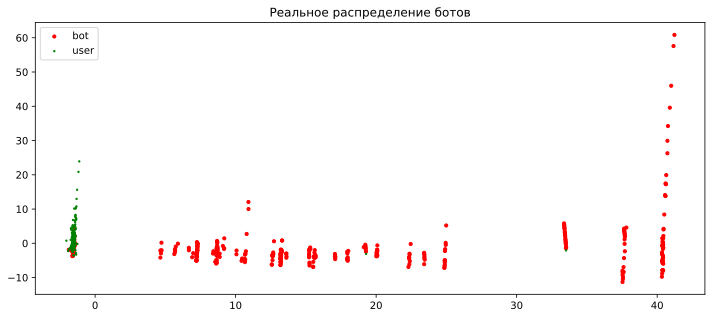

In [12]:
from sklearn.decomposition import PCA
X_train, y_train = get_train_sample(X, y, 5000, 450)
X_pca = PCA(n_components=2, random_state=42).fit_transform(X_train)
print('Число ботов в выборке: ', y_train.sum())
plot_2d_distr_scatter(X_pca, y_train)

Число ботов в выборке:  450.0


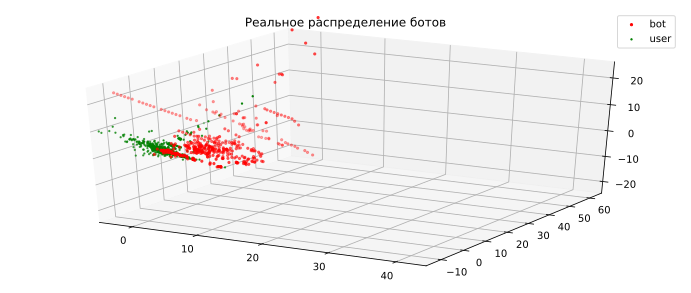

In [13]:
X_pca = PCA(n_components=3, random_state=42).fit_transform(X_train)
print('Число ботов в выборке: ', y_train.sum())
plot_3d_distr_scatter(X_pca, y_train)

Как видим в случае концетрированного содержания ботов в сэмпле выборки очень хорошо разделимы. Посмотрим как обстоят дела на реальном сэмпле

Число ботов в выборке:  17


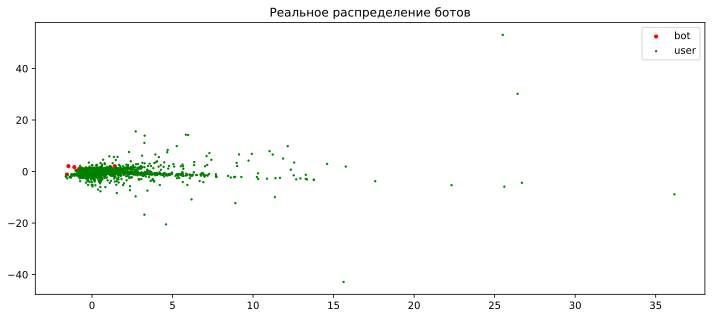

In [14]:
X_train, y_train = get_random_sample(X, y, 10000)
X_pca = PCA(n_components=2, random_state=42).fit_transform(X_train)
print('Число ботов в выборке: ', y_train.sum())
plot_2d_distr_scatter(X_pca, y_train)
del(X_pca)

In [15]:
X_pca = PCA(n_components=3, random_state=42).fit_transform(X_train)
print('Число ботов в выборке: ', y_train.sum())
plot_3d_distr_scatter(X_pca, y_train)

Число ботов в выборке:  17


В этом случае разделимость весьма нестабильная и зависит от выборки к выборке

В целом есть надежда на то, что при большем количестве точек разделимость будет лучше. Однако больше точек мой ноут отказывает визуализировать, однако будем иметь в виду. Тем более PCA достаточно легковесная операция(сводится к умножению пары матриц и нахождению собственных значений). Посмотрим, сколько информации мы теряем на каждой компоненте

100%|██████████| 23/23 [00:24<00:00,  1.19s/it]


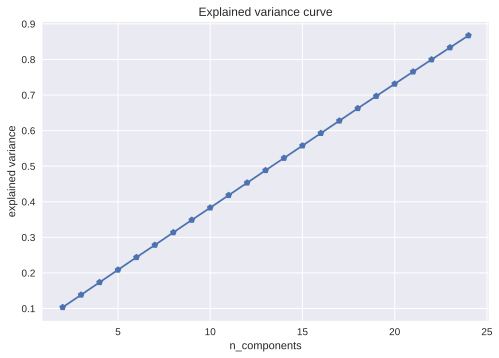

In [30]:
explained = []
for k in tqdm(range(2, 25)):
    pca = PCA(n_components=k, random_state=42).fit(X)
    explained.append(np.sum(pca.explained_variance_ratio_))
plt.plot(range(2, 25), explained, '-p')
plt.title('Explained variance curve')
plt.xlabel('n_components')
plt.ylabel('explained variance')
plt.show()

Линейная функция... В общем злоупотреблять PCA нельзя. Попробуем какой-нибудь нелинейный метод понижения размерности

## Многомерное шкалирование(MDS)

Число ботов в выборке:  450.0


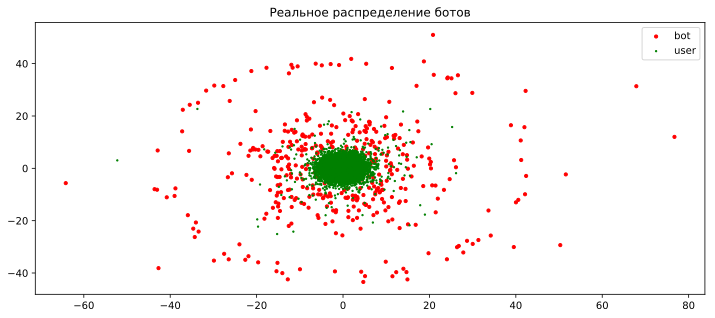

In [16]:
from sklearn import manifold
mds = manifold.MDS(n_components = 2, n_init = 1, max_iter = 10)
X_train, y_train = get_train_sample(X, y, 5000, 450)

X_mds = mds.fit_transform(X_train)
print('Число ботов в выборке: ', y_train.sum())
plot_2d_distr_scatter(X_mds, y_train)

Число ботов в выборке:  450.0


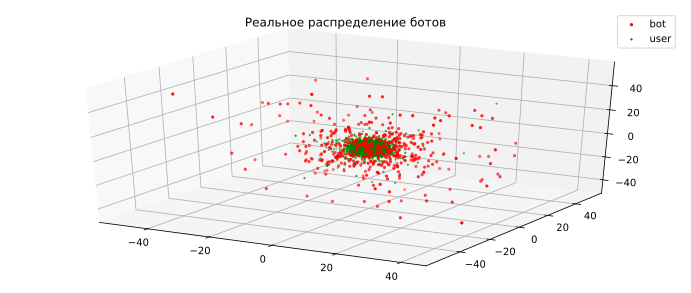

In [18]:
mds = manifold.MDS(n_components = 3, n_init = 1, max_iter = 10)

X_mds = mds.fit_transform(X_train)
print('Число ботов в выборке: ', y_train.sum())
plot_3d_distr_scatter(X_mds, y_train)

На концетрированной выборке разделение стало еще прозрачнее! Посмотрим как дела на случайном семпле.

Число ботов в выборке:  6
CPU times: user 7.32 s, sys: 2.33 s, total: 9.64 s
Wall time: 6.73 s


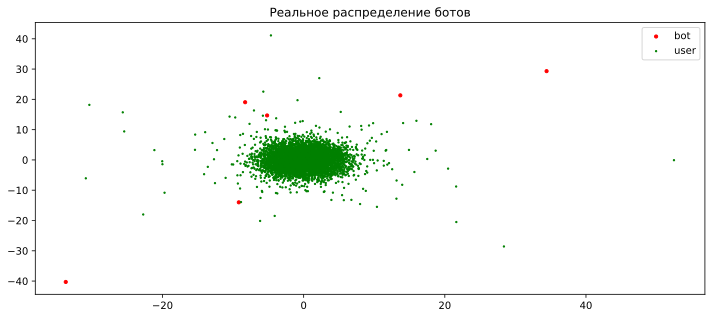

In [19]:
mds = manifold.MDS(n_components = 2, n_init = 1, max_iter = 10)

X_train, y_train = get_random_sample(X, y, 5000)
print('Число ботов в выборке: ', y_train.sum())
%time X_mds = mds.fit_transform(X_train)
plot_2d_distr_scatter(X_mds, y_train)

Уже довольно таки неплохо, хотя не бог весть как стабильно.

Число ботов в выборке:  6
CPU times: user 7.7 s, sys: 2.32 s, total: 10 s
Wall time: 7.12 s


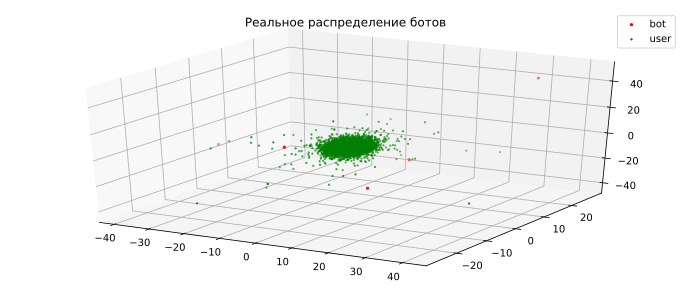

In [20]:
mds = manifold.MDS(n_components = 3, n_init = 1, max_iter = 10)

print('Число ботов в выборке: ', y_train.sum())

%time X_mds = mds.fit_transform(X_train)
plot_3d_distr_scatter(X_mds, y_train)

## T-Sne

In [ ]:
tsne = manifold.t_sne.TSNE(n_components = 2, init = 'pca', random_state=42)

X_train, y_train = get_train_sample(X, y, 5000, 450)
print('Число ботов в выборке: ', y_train.sum())
%time X_tsne = tsne.fit_transform(X_train)
plot_2d_distr_scatter(X_tsne, y_train)

Число ботов в выборке:  450.0
CPU times: user 1min 35s, sys: 4.61 s, total: 1min 40s
Wall time: 1min 40s


Число ботов в выборке:  6
CPU times: user 56.9 s, sys: 3.79 s, total: 1min
Wall time: 59.4 s


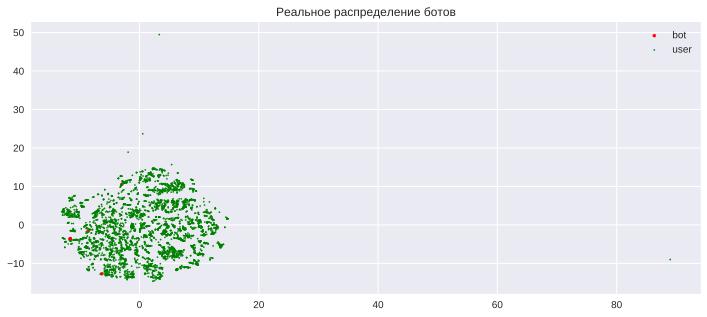

In [39]:
tsne = manifold.t_sne.TSNE(n_components = 2, init = 'pca', random_state=42)

X_train, y_train = get_random_sample(X, y, 5000)
print('Число ботов в выборке: ', y_train.sum())
%time X_tsne = tsne.fit_transform(X_train)
plot_2d_distr_scatter(X_tsne, y_train)

t-sne красивый, но пока видимо стоит отложить в долгий ящик, так как уж слишком алгоритм тяжеловесный для моей машинки, а на 2 размерности не прямо так уж и блещет

В общем вот такие красивые картинки мы получаем.
Уже виден фронт работ, а именно попробовать на разных низкоранговых приближениях какие-нибудь алгоритмы кластеризации.

При это какие именно видно уже по получаемым картинкам(а не то чтобы мы их из любопытства рисовали) - буду пробовать DBSCAN и One-class-SVM.

Продолжение следует)

In [37]:
X.to_csv('clear_data.csv', index=None)
y.to_csv('clear_target.csv', index=None)